# Goodreads Topics, Profiles, and Recommendations

In [1]:
%matplotlib inline

import pandas as pd
import numpy as np

# raw_data_path = '../input/goodreads10kcsv/'
# model_output_path = '../input/goodreads-models/'

raw_data_path = './data/raw/goodbooks-10k/'
model_output_path = './data/models/'

ratings_df = pd.read_csv(raw_data_path + 'ratings.csv',
                         dtype={
                             'rating': np.uint8,
                             'user_id': np.uint16,
                             'book_id': np.uint16
                         })

to_read_df = pd.read_csv(raw_data_path + 'to_read.csv')
books_df = pd.read_csv(raw_data_path + 'books.csv')

tags_df = pd.read_csv(raw_data_path + 'tags.csv')
book_tags_df = pd.read_csv(raw_data_path + 'book_tags.csv')

In [2]:
ratings_df.head()

,user_id,book_id,rating
0,1,258,5
1,2,4081,4
2,2,260,5
3,2,9296,5
4,2,2318,3


In [3]:
to_read_df.head()

,user_id,book_id
0,9,8
1,15,398
2,15,275
3,37,7173
4,34,380


In [4]:
books_df.head()

,book_id,goodreads_book_id,best_book_id,work_id,books_count,isbn,isbn13,authors,original_publication_year,original_title,...,ratings_count,work_ratings_count,work_text_reviews_count,ratings_1,ratings_2,ratings_3,ratings_4,ratings_5,image_url,small_image_url
0,1,2767052,2767052,2792775,272,439023483,9.780439e+12,Suzanne Collins,2008.0,The Hunger Games,...,4780653,4942365,155254,66715,127936,560092,1481305,2706317,https://images.gr-assets.com/books/1447303603m...,https://images.gr-assets.com/books/1447303603s...
1,2,3,3,4640799,491,439554934,9.780440e+12,"J.K. Rowling, Mary GrandPré",1997.0,Harry Potter and the Philosopher's Stone,...,4602479,4800065,75867,75504,101676,455024,1156318,3011543,https://images.gr-assets.com/books/1474154022m...,https://images.gr-assets.com/books/1474154022s...
2,3,41865,41865,3212258,226,316015849,9.780316e+12,Stephenie Meyer,2005.0,Twilight,...,3866839,3916824,95009,456191,436802,793319,875073,1355439,https://images.gr-assets.com/books/1361039443m...,https://images.gr-assets.com/books/1361039443s...
3,4,2657,2657,3275794,487,61120081,9.780061e+12,Harper Lee,1960.0,To Kill a Mockingbird,...,3198671,3340896,72586,60427,117415,446835,1001952,1714267,https://images.gr-assets.com/books/1361975680m...,https://images.gr-assets.com/books/1361975680s...
4,5,4671,4671,245494,1356,743273567,9.780743e+12,F. Scott Fitzgerald,1925.0,The Great Gatsby,...,2683664,2773745,51992,86236,197621,606158,936012,947718,https://images.gr-assets.com/books/1490528560m...,https://images.gr-assets.com/books/1490528560s...


In [5]:
tags_df.head()

,tag_id,tag_name
0,0,-
1,1,--1-
2,2,--10-
3,3,--12-
4,4,--122-


In [6]:
book_tags_df.head()

,goodreads_book_id,tag_id,count
0,1,30574,167697
1,1,11305,37174
2,1,11557,34173
3,1,8717,12986
4,1,33114,12716


In [7]:
bks_cols = ['authors', 'title']
books_cols = [
    'goodreads_book_id', 'book_id', 'authors', 'title', 'average_rating',
    'ratings_count'
]

In [8]:
books_df[books_cols].head(25)

,goodreads_book_id,book_id,authors,title,average_rating,ratings_count
0,2767052,1,Suzanne Collins,"The Hunger Games (The Hunger Games, #1)",4.34,4780653
1,3,2,"J.K. Rowling, Mary GrandPré",Harry Potter and the Sorcerer's Stone (Harry P...,4.44,4602479
2,41865,3,Stephenie Meyer,"Twilight (Twilight, #1)",3.57,3866839
3,2657,4,Harper Lee,To Kill a Mockingbird,4.25,3198671
4,4671,5,F. Scott Fitzgerald,The Great Gatsby,3.89,2683664
5,11870085,6,John Green,The Fault in Our Stars,4.26,2346404
6,5907,7,J.R.R. Tolkien,The Hobbit,4.25,2071616
7,5107,8,J.D. Salinger,The Catcher in the Rye,3.79,2044241
8,960,9,Dan Brown,"Angels & Demons (Robert Langdon, #1)",3.85,2001311
9,1885,10,Jane Austen,Pride and Prejudice,4.24,2035490


In [9]:
W10 = np.loadtxt(model_output_path + 'W_10' + '.csv', dtype=np.float16)
H10 = np.loadtxt(model_output_path + 'H_10' + '.csv', dtype=np.float16)
print('Model size (bytes): ' + '{:,}'.format(W10.nbytes + H10.nbytes))

Model size (bytes): 1,268,480


In [10]:
W25 = np.loadtxt(model_output_path + 'W_25' + '.csv', dtype=np.float16)
H25 = np.loadtxt(model_output_path + 'H_25' + '.csv', dtype=np.float16)
print('Model size (bytes): ' + '{:,}'.format(W25.nbytes + H25.nbytes))

Model size (bytes): 3,171,200


In [11]:
W50 = np.loadtxt(model_output_path + 'W_50' + '.csv', dtype=np.float16)
H50 = np.loadtxt(model_output_path + 'H_50' + '.csv', dtype=np.float16)
print('Model size (bytes): ' + '{:,}'.format(W50.nbytes + H50.nbytes))

Model size (bytes): 6,342,400


In [12]:
# Clean-up a few common tags not clearly relevant to topic (manual insepection)
# or highly generic ('fiction', 'fantasy')
# Todo: stemming, cleaning

book_topic_remove_tags_list = [
    30574, 8717, 11557, 5207, 22743, 11590, 22753, 30521, 11743
    # fantasy:
    #, 11305?
]
tags_df.loc[book_topic_remove_tags_list]

,tag_id,tag_name
30574,30574,to-read
8717,8717,currently-reading
11557,11557,favorites
5207,5207,books-i-own
22743,22743,owned
11590,11590,favourites
22753,22753,owned-books
30521,30521,to-buy
11743,11743,fiction


## Topic Models

### $k=10$

In [13]:
# Declare model
model_dfs = (pd.DataFrame(data=W10), pd.DataFrame(data=H10.T))

# Get the value of k from the model
n_components = len(model_dfs[1].columns)

#### Inspect Top Books in Topic

In [14]:
# Make a dictionary of dataframes containing book topic vectors
books_and_topics_dict = {
    topic:
    (model_dfs[1].join(books_df[books_cols]).sort_values(by=topic,
                                                         ascending=False))
    for topic in range(n_components)
}

In [15]:
show_rows = 12
 
top_books_in_topic_df = pd.DataFrame(
    pd.concat(
        [
            pd.DataFrame(data=books_and_topics_dict[topic][
                ['authors', 'title']].head(show_rows).reset_index(drop=True))
            for topic in range(n_components)
        ],
        axis=1,
        #        ignore_index=True
    ))

# Make column multiindex with topic, author/title
top_books_in_topic_df.columns = pd.MultiIndex.from_product(
    [list(model_dfs[1].columns),
     list(top_books_in_topic_df.columns)[:2]],
    names=['topic', ''])

top_books_in_topic_df
#top_books_in_topic_df[[7, 8, 9]]

topic                                        0  \
                                       authors   
0      George Orwell, Erich Fromm, Celâl Üster   
1                                George Orwell   
2                            Kurt Vonnegut Jr.   
3                                J.D. Salinger   
4                                Aldous Huxley   
5                          F. Scott Fitzgerald   
6                              William Golding   
7                                 Ray Bradbury   
8                                Joseph Heller   
9                               John Steinbeck   
10                                  Harper Lee   
11                                   Ken Kesey   

topic                                   \
                                 title   
0                                 1984   
1                          Animal Farm   
2                  Slaughterhouse-Five   
3               The Catcher in the Rye   
4                      Brave New World   
5                     The Great Gatsby   
6                    Lord of the Flies   
7                       Fahrenheit 451   
8                             Catch-22   
9                      Of Mice and Men   
10               To Kill a Mockingbird   
11     One Flew Over the Cuckoo's Nest   

topic                                        1  \
                                       authors   
0      J.K. Rowling, Mary GrandPré, Rufus Beck   
1                  J.K. Rowling, Mary GrandPré   
2                  J.K. Rowling, Mary GrandPré   
3                  J.K. Rowling, Mary GrandPré   
4                  J.K. Rowling, Mary GrandPré   
5                  J.K. Rowling, Mary GrandPré   
6                  J.K. Rowling, Mary GrandPré   
7                                    Dan Brown   
8                              Suzanne Collins   
9                              Suzanne Collins   
10                             Stephenie Meyer   
11                             Stephenie Meyer   

topic                                                     \
                                                   title   
0      Harry Potter and the Prisoner of Azkaban (Harr...   
1      Harry Potter and the Goblet of Fire (Harry Pot...   
2      Harry Potter and the Deathly Hallows (Harry Po...   
3      Harry Potter and the Half-Blood Prince (Harry ...   
4      Harry Potter and the Order of the Phoenix (Har...   
5      Harry Potter and the Chamber of Secrets (Harry...   
6      Harry Potter and the Sorcerer's Stone (Harry P...   
7                 The Da Vinci Code (Robert Langdon, #2)   
8                   Catching Fire (The Hunger Games, #2)   
9                      Mockingjay (The Hunger Games, #3)   
10                                Eclipse (Twilight, #3)   
11                               New Moon (Twilight, #2)   

topic                           2  \
                          authors   
0                Kathryn Stockett   
1                   Gillian Flynn   
2                 Khaled Hosseini   
3                      Sara Gruen   
4                    Markus Zusak   
5      Stieg Larsson, Reg Keeland   
6                   Paula Hawkins   
7                   Sue Monk Kidd   
8                 Khaled Hosseini   
9                   Anthony Doerr   
10                Jeannette Walls   
11                   Alice Sebold   

topic                                                                     3  \
                                                  title             authors   
0                                              The Help  George R.R. Martin   
1                                             Gone Girl  George R.R. Martin   
2                                       The Kite Runner  George R.R. Martin   
3                                   Water for Elephants      J.R.R. Tolkien   
4                                        The Book Thief      J.R.R. Tolkien   
5      The Girl with the Dragon Tattoo (Millennium, #1)    Orson Scott Card   
6                

#### Inspect Top Tags in Topic

For each of the books with category score at least `cutoff` in a `topic`, compute the weighted sum of the top 100 tags for that book, with weights given by the score for that book within `topic`. Then generate wordclouds for the top tags in each topic.

In [16]:
def column_dot(x, topic):
    return pd.Series(data=(x[topic] * x['count']).sum())

def show_top_book_topic_tags(dict_of_df, topic, cutoff=2):
    """Given a dictionary of topic dataframes, as in
    books_and_topics_dict, return the top book tags via a
    weighted sum by topic vector and book tag counts."""

    # Keep topic vector components greater than cutoff
    shortened_topic_df = dict_of_df[topic][(
        dict_of_df[topic])[topic] >= cutoff][books_cols + [topic]]

    # Join tags
    shortened_topic_tags_df = pd.merge(
        shortened_topic_df[[topic, 'goodreads_book_id']],
        book_tags_df,
        on='goodreads_book_id')

    # Compute weighted sum
    top_topic_tags_df = (
        shortened_topic_tags_df.groupby(['goodreads_book_id', 'tag_id']).apply(
            column_dot, topic).groupby('tag_id').sum()
        # Sort, join tag names, drop extraneous
        # weighted sum column is named 0
        .sort_values(by=0, ascending=False).join(tags_df).drop(
            labels=book_topic_remove_tags_list))

    return top_topic_tags_df

In [17]:
import matplotlib.pyplot as plt
from wordcloud import WordCloud


def plot_tagcloud(ax, topic, width=400, height=200):
    """Plot a frequency wordcloud of tags in topic (int)"""

    # Call WordCloud with options
    wc = WordCloud(background_color="white",
                   max_words=100,
                   width=width,
                   height=height)

    # generate word cloud
    wc.generate_from_frequencies(topics[topic])

    # show
    ax.imshow(wc, interpolation="bilinear")
    ax.set_title('Topic ' + str(topic))
    ax.axis("off")

    return ax

In [18]:
# Dict of dict of top topics: Keys are topic numbers;
# Values are dictionaries in which keys are tags,
# and values intratopic scores

topics = {
    topic: show_top_book_topic_tags(books_and_topics_dict, topic)[[
        'tag_name', 0
    ]].reset_index(drop=True).set_index('tag_name').to_dict()[0]
    for topic in books_and_topics_dict.keys()
}

In [19]:
# Topic 7 is notable
pd.Series(topics[7]).head(show_rows)

horror             540307.478516
stephen-king       279919.134766
fantasy            193002.996094
thriller            64384.876953
king                60575.052734
science-fiction     44781.710938
default             44575.900391
classics            42561.953125
sci-fi              35729.720703
mystery             27013.197266
supernatural        25682.228516
suspense            24441.669922
dtype: float64

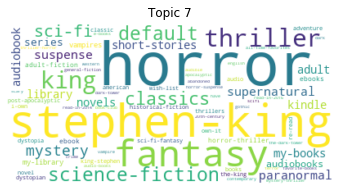

In [20]:
# Plot wordcloud
fig, ax = plt.subplots(figsize=(6, 3))
ax = plot_tagcloud(ax, 7)
plt.show()

In [21]:
# Concatenate the list of top tag_names for each topic
top_tag_names_df = pd.concat([
    pd.Series(pd.Series(topics[topic]).head(show_rows).index).rename(topic)
    for topic in range(n_components)
],
                             axis=1)

top_tag_names_df

,0,1,2,3,4,5,6,7,8,9
0,classics,fantasy,historical-fiction,fantasy,mystery,young-adult,childrens,horror,young-adult,classics
1,classic,young-adult,young-adult,science-fiction,thriller,fantasy,classics,stephen-king,fantasy,fantasy
2,science-fiction,harry-potter,book-club,sci-fi,fantasy,ya,children,fantasy,romance,classic
3,sci-fi,ya,classics,classics,young-adult,dystopian,children-s-books,thriller,vampires,young-adult
4,literature,series,mystery,young-adult,crime,romance,fantasy,king,ya,romance
5,fantasy,magic,fantasy,series,suspense,series,children-s,science-fiction,paranormal,historical-fiction
6,school,childrens,contemporary,sci-fi-fantasy,series,dystopia,young-adult,default,series,literature
7,novels,re-read,ya,adventure,science-fiction,science-fiction,picture-books,classics,dystopian,school
8,dystopian,adventure,romance,epic-fantasy,john-grisham,sci-fi,childhood,sci-fi,dystopia,historical
9,historical-fiction,children,non-fiction,ya,default,paranormal,kids,mystery,vampire,novels


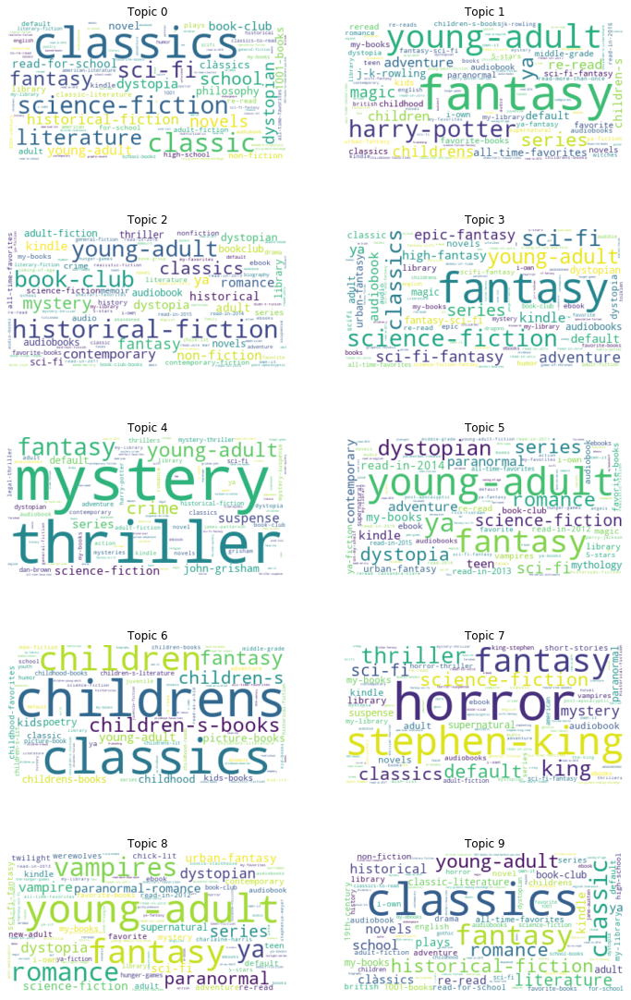

In [22]:
# Plot wordclouds for all topics as subplots

import itertools

# Set rows and columns of output
rows = 5
cols = 2

# Check dimensions of subplot
assert (rows * cols == len(topics.keys()))

fig, axs = plt.subplots(rows, cols, figsize=(12, 20))

for (row, col) in itertools.product(range(rows), range(cols)):
    topic = col + row * cols
    axs[row, col] = plot_tagcloud(axs[row, col], topic)
    
plt.show()

In [23]:
# Names from inspection of top books and tags
manual_book_topics = {
    0: 'Modern Classics',
    1: 'Harry Potter',
    2: 'Fiction',
    3: 'Fantasy & Sci-Fi',
    4: 'Thrillers',
    5: 'Young Adult',
    6: 'Children\'s',
    7: 'Stephen King',
    8: 'Twilight & Fifty Shades',
    9: 'Austen & Brontës'
}

In [24]:
top_books_in_topic_df.rename(manual_book_topics, axis=1)

topic                          Modern Classics  \
                                       authors   
0      George Orwell, Erich Fromm, Celâl Üster   
1                                George Orwell   
2                            Kurt Vonnegut Jr.   
3                                J.D. Salinger   
4                                Aldous Huxley   
5                          F. Scott Fitzgerald   
6                              William Golding   
7                                 Ray Bradbury   
8                                Joseph Heller   
9                               John Steinbeck   
10                                  Harper Lee   
11                                   Ken Kesey   

topic                                   \
                                 title   
0                                 1984   
1                          Animal Farm   
2                  Slaughterhouse-Five   
3               The Catcher in the Rye   
4                      Brave New World   
5                     The Great Gatsby   
6                    Lord of the Flies   
7                       Fahrenheit 451   
8                             Catch-22   
9                      Of Mice and Men   
10               To Kill a Mockingbird   
11     One Flew Over the Cuckoo's Nest   

topic                             Harry Potter  \
                                       authors   
0      J.K. Rowling, Mary GrandPré, Rufus Beck   
1                  J.K. Rowling, Mary GrandPré   
2                  J.K. Rowling, Mary GrandPré   
3                  J.K. Rowling, Mary GrandPré   
4                  J.K. Rowling, Mary GrandPré   
5                  J.K. Rowling, Mary GrandPré   
6                  J.K. Rowling, Mary GrandPré   
7                                    Dan Brown   
8                              Suzanne Collins   
9                              Suzanne Collins   
10                             Stephenie Meyer   
11                             Stephenie Meyer   

topic                                                     \
                                                   title   
0      Harry Potter and the Prisoner of Azkaban (Harr...   
1      Harry Potter and the Goblet of Fire (Harry Pot...   
2      Harry Potter and the Deathly Hallows (Harry Po...   
3      Harry Potter and the Half-Blood Prince (Harry ...   
4      Harry Potter and the Order of the Phoenix (Har...   
5      Harry Potter and the Chamber of Secrets (Harry...   
6      Harry Potter and the Sorcerer's Stone (Harry P...   
7                 The Da Vinci Code (Robert Langdon, #2)   
8                   Catching Fire (The Hunger Games, #2)   
9                      Mockingjay (The Hunger Games, #3)   
10                                Eclipse (Twilight, #3)   
11                               New Moon (Twilight, #2)   

topic                     Fiction  \
                          authors   
0                Kathryn Stockett   
1                   Gillian Flynn   
2                 Khaled Hosseini   
3                      Sara Gruen   
4                    Markus Zusak   
5      Stieg Larsson, Reg Keeland   
6                   Paula Hawkins   
7                   Sue Monk Kidd   
8                 Khaled Hosseini   
9                   Anthony Doerr   
10                Jeannette Walls   
11                   Alice Sebold   

topic                                                      Fantasy & Sci-Fi  \
                                                  title             authors   
0                                              The Help  George R.R. Martin   
1                                             Gone Girl  George R.R. Martin   
2                                       The Kite Runner  George R.R. Martin   
3                                   Water for Elephants      J.R.R. Tolkien   
4                                        The Book Thief      J.R.R. Tolkien   
5      The Girl with the Dragon Tattoo (Millennium, #1)    Orson Scott Card   
6                

In [25]:
top_tag_names_df.rename(manual_book_topics, axis=1)

,Modern Classics,Harry Potter,Fiction,Fantasy & Sci-Fi,Thrillers,Young Adult,Children's,Stephen King,Twilight & Fifty Shades,Austen & Brontës
0,classics,fantasy,historical-fiction,fantasy,mystery,young-adult,childrens,horror,young-adult,classics
1,classic,young-adult,young-adult,science-fiction,thriller,fantasy,classics,stephen-king,fantasy,fantasy
2,science-fiction,harry-potter,book-club,sci-fi,fantasy,ya,children,fantasy,romance,classic
3,sci-fi,ya,classics,classics,young-adult,dystopian,children-s-books,thriller,vampires,young-adult
4,literature,series,mystery,young-adult,crime,romance,fantasy,king,ya,romance
5,fantasy,magic,fantasy,series,suspense,series,children-s,science-fiction,paranormal,historical-fiction
6,school,childrens,contemporary,sci-fi-fantasy,series,dystopia,young-adult,default,series,literature
7,novels,re-read,ya,adventure,science-fiction,science-fiction,picture-books,classics,dystopian,school
8,dystopian,adventure,romance,epic-fantasy,john-grisham,sci-fi,childhood,sci-fi,dystopia,historical
9,historical-fiction,children,non-fiction,ya,default,paranormal,kids,mystery,vampire,novels


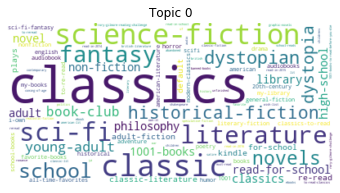

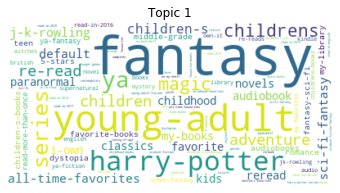

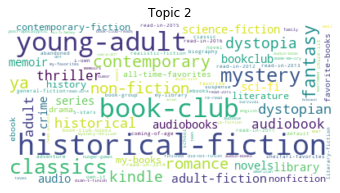

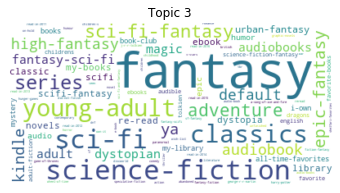

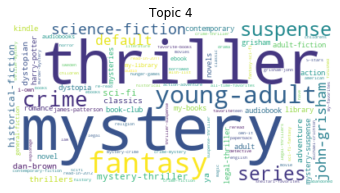

...

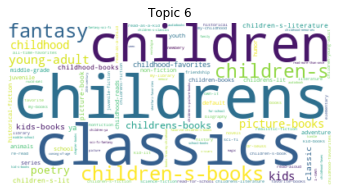

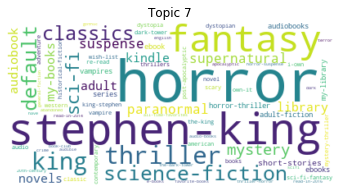

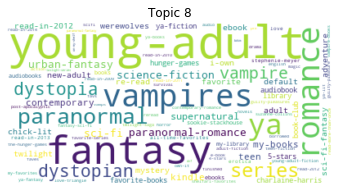

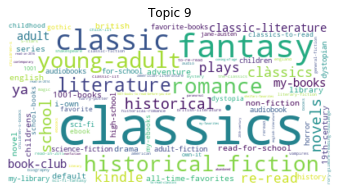

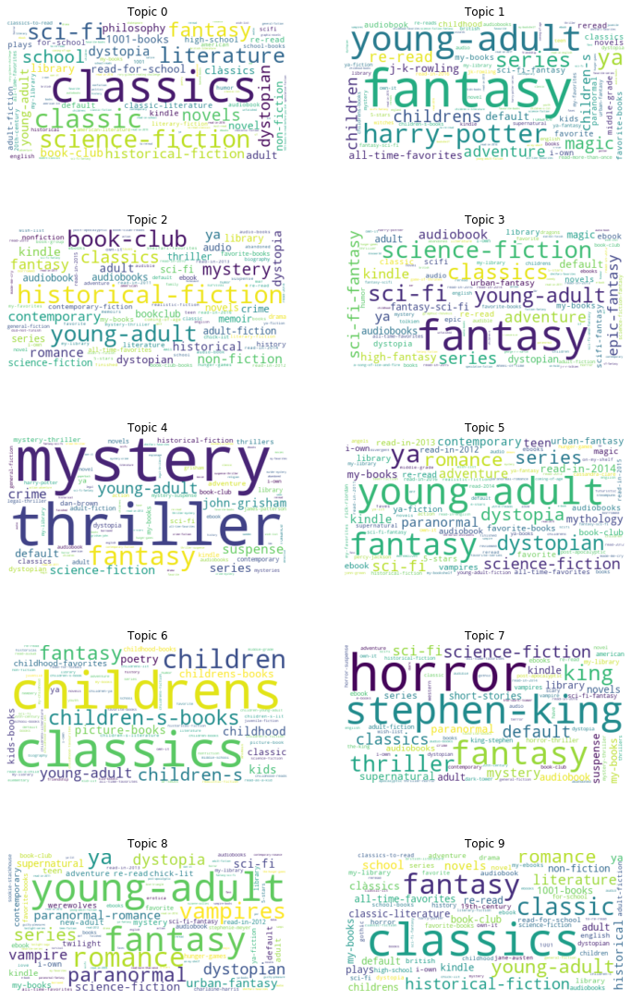

In [26]:
# Image Output

image_output_path = './image/goodreads-topics-profiles-recommendations/'

for topic in range(n_components):
    fig, ax = plt.subplots(figsize=(6, 3))
    ax = plot_tagcloud(ax, topic)
    plt.savefig(image_output_path + 'tag-cloud-10-' + str(topic) + '.png',
                bbox_inches='tight',
                dpi=150)

# Set rows and columns of output
rows = 5
cols = 2

# Check dimensions of subplot
assert (rows * cols == len(topics.keys()))

fig, axs = plt.subplots(rows, cols, figsize=(12, 20))

for (row, col) in itertools.product(range(rows), range(cols)):
    topic = col + row * cols
    axs[row, col] = plot_tagcloud(axs[row, col], topic)

plt.savefig(image_output_path + 'tag-cloud-10.png',
            bbox_inches='tight',
            dpi=150)

In [27]:
# Table Output

table_output_path = './table/goodreads-topics-profiles-recommendations/'

tags_df.head().to_latex(
    table_output_path + 'tags.tex',
    index=False) 

book_tags_df.head().to_latex(
    table_output_path + 'book-tags.tex',
    index=False)  

(tags_df.loc[book_topic_remove_tags_list]).to_latex(
    table_output_path + 'book-topic-remove-tags.tex',
    columns=['tag_name'],
    index=False)  

top_books_in_topic_df.rename(manual_book_topics, axis=1).to_latex(
    table_output_path + 'top-books-in-topic.tex',
    index=False,
    column_format='p{3cm}' * len(top_books_in_topic_df.columns))

top_tag_names_df.rename(manual_book_topics, axis=1).to_latex(
    table_output_path + 'top-tag-names-left.tex',
    index=False,
    columns=[manual_book_topics[topic] for topic in range(5)])

top_tag_names_df.rename(manual_book_topics, axis=1).to_latex(
    table_output_path + 'top-tag-names-right.tex',
    index=False,
    columns=[manual_book_topics[topic] for topic in range(5,10)])

for topic in range(n_components):
    top_books_in_topic_df.rename(
        manual_book_topics, axis=1).loc[:, manual_book_topics[topic]].to_latex(
            table_output_path + 'top-books-in-topic-' + str(topic) + '.tex',
    index=False)

### $k=25$

In [28]:
# Declare model
model_dfs = (pd.DataFrame(data=W25), pd.DataFrame(data=H25.T))

# Get the value of k from the model
n_components = len(model_dfs[1].columns)

#### Inspect Top Books in Topic

In [29]:
# Make a dictionary of dataframes containing book topic vectors
books_and_topics_dict = {
    topic:
    (model_dfs[1].join(books_df[books_cols]).sort_values(by=topic,
                                                         ascending=False))
    for topic in range(len(model_dfs[1].columns))
}

In [30]:
show_rows = 12

top_books_in_topic_df = pd.DataFrame(
    pd.concat(
        [
            pd.DataFrame(data=books_and_topics_dict[topic][
                ['authors', 'title']].head(show_rows).reset_index(drop=True))
            for topic in range(len(model_dfs[1].columns))
        ],
        axis=1,
        #        ignore_index=True
    ))

top_books_in_topic_df.columns = pd.MultiIndex.from_product(
    [list(model_dfs[1].columns),
     list(top_books_in_topic_df.columns)[:2]],
    names=['topic', ''])

In [31]:
# Inspect a subset of topics
topics_list = list(range(5))

In [32]:
top_books_in_topic_df[topics_list]

topic                                                  0  \
                                                 authors   
0                                             Harper Lee   
1                                          George Orwell   
2                                    F. Scott Fitzgerald   
3                                          J.D. Salinger   
4                George Orwell, Erich Fromm, Celâl Üster   
5                                        William Golding   
6                                         John Steinbeck   
7                                           Ray Bradbury   
8                                          Aldous Huxley   
9                  Mark Twain, John Seelye, Guy Cardwell   
10     Anne Frank, Eleanor Roosevelt, B.M. Mooyaart-D...   
11         William Shakespeare, Robert           Jackson   

topic                                      \
                                    title   
0                   To Kill a Mockingbird   
1                             Animal Farm   
2                        The Great Gatsby   
3                  The Catcher in the Rye   
4                                    1984   
5                       Lord of the Flies   
6                         Of Mice and Men   
7                          Fahrenheit 451   
8                         Brave New World   
9      The Adventures of Huckleberry Finn   
10              The Diary of a Young Girl   
11                       Romeo and Juliet   

topic                                        1  \
                                       authors   
0      J.K. Rowling, Mary GrandPré, Rufus Beck   
1                  J.K. Rowling, Mary GrandPré   
2                  J.K. Rowling, Mary GrandPré   
3                  J.K. Rowling, Mary GrandPré   
4                  J.K. Rowling, Mary GrandPré   
5                  J.K. Rowling, Mary GrandPré   
6                  J.K. Rowling, Mary GrandPré   
7                                    Dan Brown   
8                                 J.K. Rowling   
9                   C.S. Lewis, Pauline Baynes   
10                   Roald Dahl, Quentin Blake   
11     John Tiffany, Jack Thorne, J.K. Rowling   

topic                                                     \
                                                   title   
0      Harry Potter and the Prisoner of Azkaban (Harr...   
1      Harry Potter and the Goblet of Fire (Harry Pot...   
2      Harry Potter and the Half-Blood Prince (Harry ...   
3      Harry Potter and the Deathly Hallows (Harry Po...   
4      Harry Potter and the Order of the Phoenix (Har...   
5      Harry Potter and the Chamber of Secrets (Harry...   
6      Harry Potter and the Sorcerer's Stone (Harry P...   
7                 The Da Vinci Code (Robert Langdon, #2)   
8                           The Tales of Beedle the Bard   
9      The Chronicles of Narnia (Chronicles of Narnia...   
10                                               Matilda   
11     Harry Potter and the Cursed Child - Parts One ...   

topic                      2                                       \
                     authors                                title   
0              Paula Hawkins                The Girl on the Train   
1              Anthony Doerr          All the Light We Cannot See   
2              Gillian Flynn                            Gone Girl   
3                 Jojo Moyes    Me Before You (Me Before You, #1)   
4             Kristin Hannah                      The Nightingale   
5             Liane Moriarty                      Big Little Lies   
6                 John Green               The Fault in Our Stars   
7             Liane Moriarty                 The Husband's Secret   
8                Donna Tartt                        The Goldfinch   
9      Christina Baker Kline                         Orphan Train   
10            Graeme Simsion  The Rosie Project (Don Tillman, #1)   
11              Maria Semple           Where'd You Go, Bernadette   

topic              

#### Inspect Top Tags in Topic

In [33]:
# Dict of dict of top topics: Keys are topic numbers;
# Values are dictionaries in which keys are tags,
# and values intratopic scores

topics = {
    topic: show_top_book_topic_tags(books_and_topics_dict, topic)[[
        'tag_name', 0
    ]].reset_index(drop=True).set_index('tag_name').to_dict()[0]
    for topic in books_and_topics_dict.keys()
}

In [34]:
# Concatenate the list of top tag_names for each topic
top_tag_names_df = pd.concat([
    pd.Series(pd.Series(topics[topic]).head(show_rows).index).rename(topic)
    for topic in range(n_components)
],
                             axis=1)

top_tag_names_df[topics_list]

,0,1,2,3,4
0,classics,fantasy,book-club,science-fiction,horror
1,classic,young-adult,historical-fiction,sci-fi,stephen-king
2,fantasy,harry-potter,mystery,fantasy,fantasy
3,literature,ya,young-adult,classics,thriller
4,school,series,contemporary,young-adult,king
5,science-fiction,magic,ya,scifi,classics
6,young-adult,childrens,kindle,dystopian,science-fiction
7,historical-fiction,re-read,audiobook,classic,default
8,sci-fi,children,romance,dystopia,mystery
9,novels,adventure,thriller,sci-fi-fantasy,sci-fi


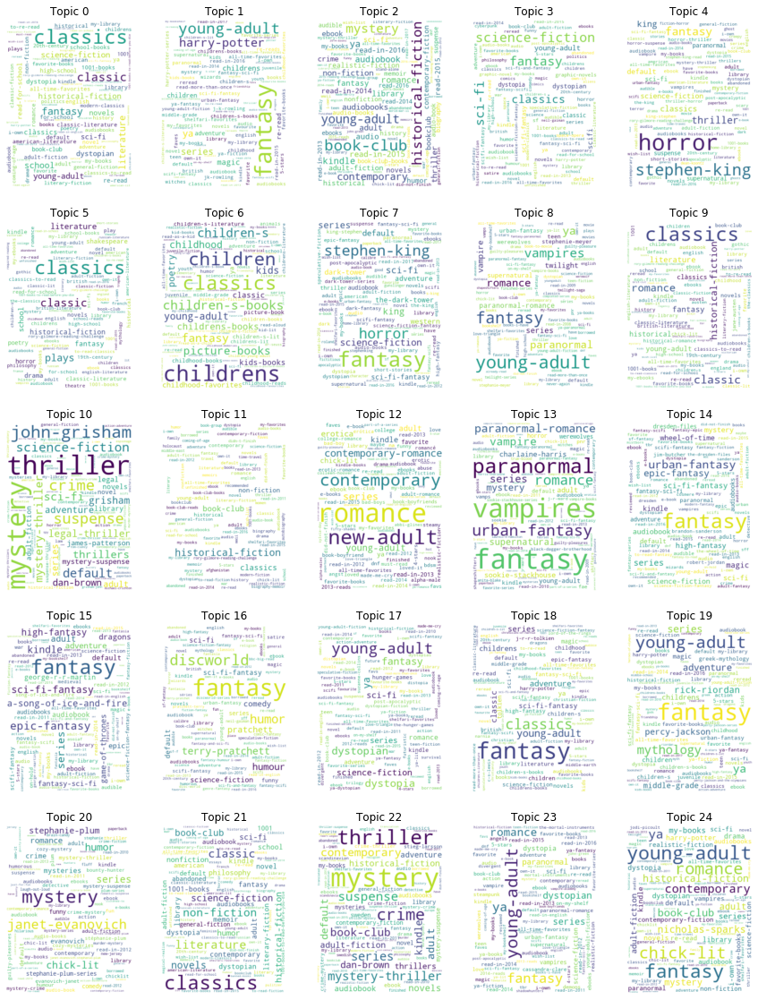

In [35]:
# Plot wordclouds for all topics as subplots

import itertools

# Set rows and columns of output
rows = 5
cols = 5

# Check dimensions of subplot
assert (rows * cols == len(topics.keys()))

fig, axs = plt.subplots(rows, cols, figsize=(15, 20))

for (row, col) in itertools.product(range(rows), range(cols)):
    topic = col + row * cols
    axs[row, col] = plot_tagcloud(axs[row, col], topic, width=300, height=400)

Further clustering leads to further refinements in topics. For example, there is now a single sci-fi topic ($k=10$ had a Sci-Fi and Fantasy topic); there are many fantasy topics centered around more specific fantasy series. In addiion, there are now two Stephen King topics. But there is a clear distinction between the sort of books in each topic.

In [36]:
# Sci-Fi Topic
sci_fi_topic_df = top_books_in_topic_df[[3]]
sci_fi_topic_df

topic                                        3  \
                                       authors   
0                                Douglas Adams   
1                             Orson Scott Card   
2                                Frank Herbert   
3                                 Isaac Asimov   
4                                 Ray Bradbury   
5      George Orwell, Erich Fromm, Celâl Üster   
6                                  Neil Gaiman   
7                                Aldous Huxley   
8       Alan Moore, Dave Gibbons, John Higgins   
9                                 Isaac Asimov   
10               Philip K. Dick, Roger Zelazny   
11                            Michael Crichton   

topic                                                     
                                                   title  
0      The Hitchhiker's Guide to the Galaxy (Hitchhik...  
1                        Ender's Game (Ender's Saga, #1)  
2                              Dune (Dune Chronicles #1)  
3                             Foundation (Foundation #1)  
4                                         Fahrenheit 451  
5                                                   1984  
6                      American Gods (American Gods, #1)  
7                                        Brave New World  
8                                               Watchmen  
9                                  I, Robot (Robot #0.1)  
10                  Do Androids Dream of Electric Sheep?  
11                     Jurassic Park (Jurassic Park, #1)

In [37]:
# Stephen King Topics
stephen_king_topics_df = top_books_in_topic_df.loc[:, [(4,'title'), (7,'title')]]

stephen_king_topics_df

# stephen_king_topics_df.to_latex(
#     table_output_path + 'stephen-king-topics.tex',
#     index=False) 

topic,4,7
,title,title
0,The Shining (The Shining #1),"The Drawing of the Three (The Dark Tower, #2)"
1,It,"The Waste Lands (The Dark Tower, #3)"
2,Misery,"Wizard and Glass (The Dark Tower, #4)"
3,The Stand,"Wolves of the Calla (The Dark Tower, #5)"
4,Carrie,"The Dark Tower (The Dark Tower, #7)"
5,Pet Sematary,"The Gunslinger (The Dark Tower, #1)"
6,'Salem's Lot,"Song of Susannah (The Dark Tower, #6)"
7,Needful Things,"The Wind Through the Keyhole (The Dark Tower, ..."
8,Cujo,The Eyes of the Dragon


In [38]:
stephen_king_tags_df = pd.concat(
    [
        show_top_book_topic_tags(books_and_topics_dict, topic).head(10)[[
            'tag_name', 0
        ]].reset_index(drop=True)
        for topic in [4, 7]
    ],
    axis=1)

king_cols = list(stephen_king_tags_df.columns)
king_cols[1] = 4
king_cols[3] = 7
stephen_king_tags_df.columns = king_cols

stephen_king_tags_df

,tag_name,4,tag_name,7
0,horror,764504.410156,fantasy,247250.445312
1,stephen-king,330394.240234,stephen-king,102357.718750
2,fantasy,138616.476562,horror,98633.960938
3,thriller,100242.935547,science-fiction,26623.748047
4,king,72494.458984,king,23965.853516
5,classics,67286.230469,series,23063.929688
6,science-fiction,55149.257812,sci-fi,22892.687500
7,default,54161.392578,default,18704.058594
8,mystery,43744.664062,western,14983.824219
9,sci-fi,43039.652344,dark-tower,14601.847656


Topic 4 is Stephen King (Horror) while Topic 7 is Stephen King (Fantasy).

/Users/i/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.
/Users/i/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  if __name__ == '__main__':
/Users/i/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:21: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may co

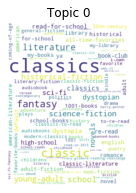

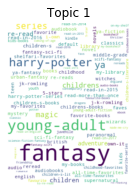

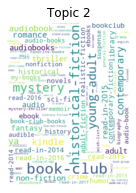

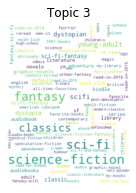

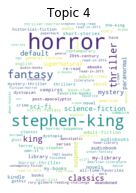

...

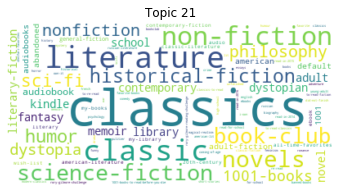

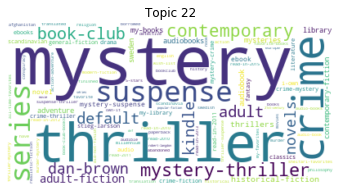

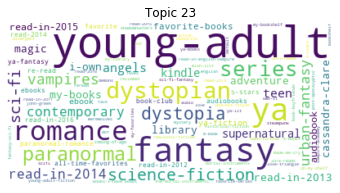

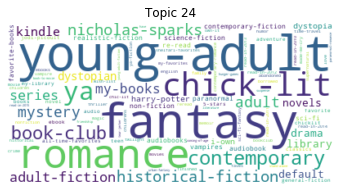

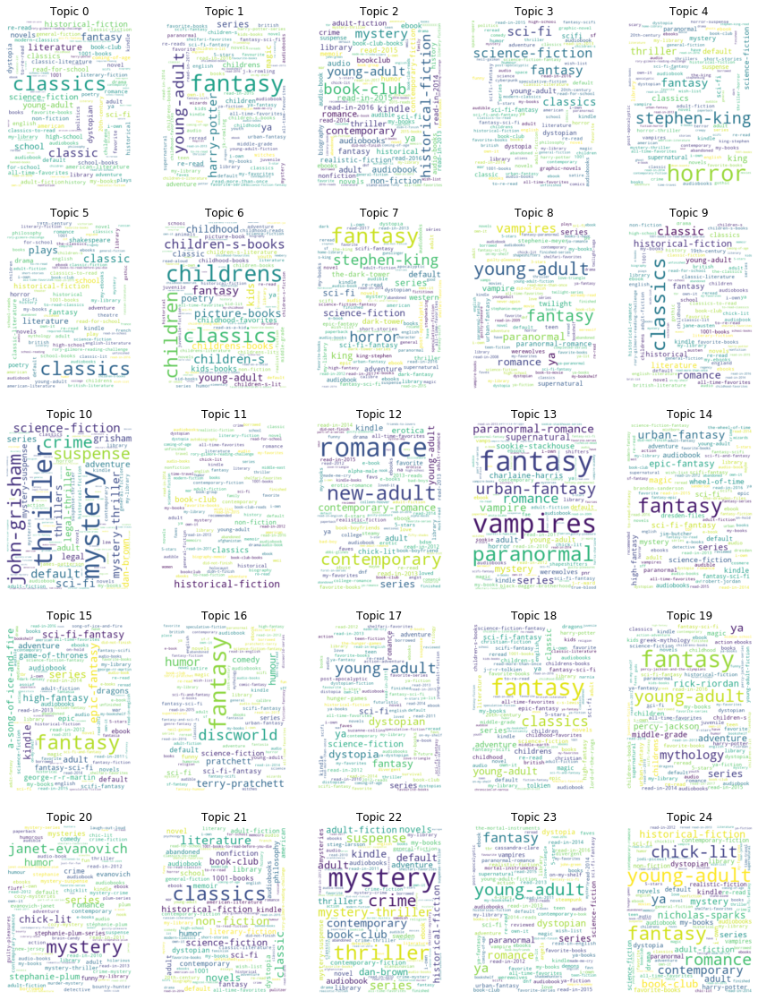

In [39]:
# Image Output

for topic in range(n_components):
    fig, ax = plt.subplots(figsize=(6, 3))
    ax = plot_tagcloud(ax, topic, width=300, height=400)
    plt.savefig(image_output_path + 'tag-cloud-25-tall-' + str(topic) + '.png', bbox_inches='tight', dpi=150)

for topic in range(n_components):
    fig, ax = plt.subplots(figsize=(6, 3))
    ax = plot_tagcloud(ax, topic, width=400, height=200)
    plt.savefig(image_output_path + 'tag-cloud-25-wide-' + str(topic) + '.png', bbox_inches='tight', dpi=150)

    
# Set rows and columns of output
rows = 5
cols = 5

# Check dimensions of subplot
assert (rows * cols == len(topics.keys()))

fig, axs = plt.subplots(rows, cols, figsize=(15, 20))

for (row, col) in itertools.product(range(rows), range(cols)):
    topic = col + row * cols
    axs[row, col] = plot_tagcloud(axs[row, col], topic, width=300, height=400)

plt.savefig(image_output_path + 'tag-cloud-25-tall.png', bbox_inches='tight', dpi=150)

In [40]:
# sci_fi_topic_df.to_latex(
#     table_output_path + 'sci-fi-topic.tex',
#     index=False,
#     column_format='p{0.45\linewidth}' * 2) 

In [41]:
# stephen_king_topics_df.to_latex(
#     table_output_path + 'stephen-king-topics.tex',
#     index=False)
# #    column_format='p{0.35\linewidth}p{0.45\linewidth}')

In [42]:
# stephen_king_tags_df.to_latex(
#     table_output_path + 'stephen-king-tags.tex',
#     index=False,
#     float_format="{:0.2f}".format) 

In [43]:
# Table Output

sci_fi_topic_df.to_latex(
    table_output_path + 'sci-fi-topic.tex',
    index=False,
    column_format='p{0.45\linewidth}' * 2) 

stephen_king_topics_df.to_latex(
    table_output_path + 'stephen-king-topics.tex',
    index=False)
#    column_format='p{0.35\linewidth}p{0.45\linewidth}')

stephen_king_tags_df.to_latex(
    table_output_path + 'stephen-king-tags.tex',
    index=False,
    float_format="{:0.2f}".format) 

## User Recommendations

For making recommendations, we should use our most complex model (`n_components = 250`). To make recommendations for a given user $u$, multiply row $u$ of $W$, $w_u$, by $H$ to obtain the completion vector $a_u = w_u \cdot H$, then select the top (unrated) values. In addition, we can use the book topics we named in the previous section ($k=10$) to make a user profile, showing the user's preferences for each category.

In [44]:
W250 = np.loadtxt(model_output_path + 'W_250' + '.csv', dtype=np.float16)
H250 = np.loadtxt(model_output_path + 'H_250' + '.csv', dtype=np.float16)
print('Model size (bytes): ' + '{:,}'.format(W250.nbytes + H250.nbytes))

Model size (bytes): 31,712,000


In [45]:
# Declare model
model_dfs = (pd.DataFrame(data=W250), pd.DataFrame(data=H250.T))

# Get the value of k from the model
n_components = len(model_dfs[1].columns)

### User Profile

In [46]:
# Pick a user
user_id = 9

# For matrix indexing
user_idx = user_id - 1

In [47]:
# k=10 user profile
user_profile = pd.DataFrame(data=W10).loc[user_idx].rename(manual_book_topics).rename(
    user_id).sort_values(ascending=False)

user_profile.index = user_profile.index.rename('topic_name')

user_profile

topic_name
Harry Potter               0.292480
Modern Classics            0.222046
Fiction                    0.216675
Twilight & Fifty Shades    0.116150
Austen & Brontës           0.057770
Thrillers                  0.015480
Stephen King               0.000000
Children's                 0.000000
Young Adult                0.000000
Fantasy & Sci-Fi           0.000000
Name: 9, dtype: float16

### User Recommendations

In [48]:
user_recommendations_df = (
    pd.merge(
        # Start with matrix product
        pd.DataFrame(data=np.matmul(model_dfs[0].loc[user_idx].values,
                                    model_dfs[1].values.T),
                     columns=['model'])
        # Array is ordered by book_id, so join
        .join(books_df),
        # Merge with user's ratings
        ratings_df[ratings_df['user_id'] == user_id],
        on='book_id',
        how='left').drop(columns='user_id')
    # Top recommendations
    .sort_values(by='model', ascending=False).reset_index(drop=True))

# Collect user's to-read tags
user_to_reads_df = pd.DataFrame(
    to_read_df[to_read_df['user_id'] == user_id]).drop(columns='user_id')
user_to_reads_df['to-read'] = True

# And merge with recommendations
user_recommendations_df = pd.merge(user_recommendations_df,
                                   user_to_reads_df,
                                   on='book_id',
                                   how='left')

# Output columns
user_recommendations_df = user_recommendations_df[[
    'authors', 'title', 'ratings_count', 'model', 'rating', 'to-read'
]]

In [49]:
# With both previously read and to-read
user_recommendations_df.head(20).tail(20)

,authors,title,ratings_count,model,rating,to-read
0,Truman Capote,In Cold Blood,381652,5.207031,5.0,NaN
1,Jane Austen,Pride and Prejudice,2035490,5.082031,5.0,NaN
2,David Sedaris,Me Talk Pretty One Day,495736,5.054688,5.0,NaN
3,F. Scott Fitzgerald,The Great Gatsby,2683664,5.046875,5.0,NaN
4,Mark Haddon,The Curious Incident of the Dog in the Night-Time,867553,5.015625,5.0,NaN
5,"George Orwell, Erich Fromm, Celâl Üster",1984,1956832,4.789062,5.0,NaN
6,Sylvia Plath,The Bell Jar,401605,4.539062,4.0,NaN
7,Stephenie Meyer,"Eclipse (Twilight, #3)",1134511,4.410156,4.0,NaN
8,Jeffrey Eugenides,Middlesex,488243,4.316406,4.0,NaN
9,Stephenie Meyer,"Breaking Dawn (Twilight, #4)",1070245,4.269531,5.0,NaN


In [50]:
# # Only user's rated books
# (user_recommendations_df[~user_recommendations_df.isna()['rating']]
#  .sort_values(by='rating', ascending=False)
#  .head(20))

In [51]:
# Only user's unrated books
(user_recommendations_df[user_recommendations_df.isna()['rating']].sort_values(
    by='model', ascending=False).head(20)).drop('rating', axis=1)

,authors,title,ratings_count,model,to-read
39,David Sedaris,When You Are Engulfed in Flames,150898,2.724609,NaN
45,"Gabriel García Márquez, Edith Grossman",Love in the Time of Cholera,283806,2.296875,True
48,"Jane Austen, James Kinsley, Deidre Shauna Lynch",Persuasion,365425,2.207031,True
51,Dave Eggers,A Heartbreaking Work of Staggering Genius,145459,2.015625,NaN
52,Michael Chabon,The Amazing Adventures of Kavalier & Clay,147717,2.013672,NaN
54,Jonathan Safran Foer,Extremely Loud and Incredibly Close,294726,1.939453,NaN
61,Sue Monk Kidd,The Secret Life of Bees,916189,1.602539,NaN
65,Kazuo Ishiguro,Never Let Me Go,294123,1.547852,NaN
67,Jeffrey Eugenides,The Virgin Suicides,159249,1.486328,NaN
68,"Stieg Larsson, Reg Keeland",The Girl Who Kicked the Hornet's Nest (Millenn...,443951,1.406250,NaN


In [52]:
user_recommendations_df[~user_recommendations_df.isna()['to-read']].drop('rating', axis=1)

,authors,title,ratings_count,model,to-read
45,"Gabriel García Márquez, Edith Grossman",Love in the Time of Cholera,283806,2.296875,True
48,"Jane Austen, James Kinsley, Deidre Shauna Lynch",Persuasion,365425,2.207031,True
83,Jennifer Egan,A Visit from the Goon Squad,120126,1.234375,True
95,Margaret Atwood,The Blind Assassin,98464,1.107422,True
106,Joan Didion,The Year of Magical Thinking,94590,0.998047,True
129,"Carlos Ruiz Zafón, Lucia Graves",The Angel's Game (The Cemetery of Forgotten Bo...,46225,0.836914,True
156,"Virginia Woolf, Maureen Howard",Mrs. Dalloway,136327,0.712402,True
184,"José Saramago, Giovanni Pontiero",Blindness,98738,0.634766,True
193,Richard Yates,Revolutionary Road,56550,0.594238,True
208,Tana French,"In the Woods (Dublin Murder Squad, #1)",188024,0.545898,True


While we do not use the to-read tag in the model, we can check the model scores on to-read books.

More users (in our dataset) read more popular books. A next step is to check whether recommendations are biased towards books with a greater `ratings_count`. Inspecting the results suggest we may want to consider recommending more novelty by introducing a weighting on books recommendations by `ratings_count` so as to recover the distribution of `ratings_count` by user.

In [53]:
# Output
user_profile.to_latex(
        table_output_path + 'user-profile-' + str(user_id) + '.tex',
        float_format="{:0.2f}".format)

user_recommendations_df.head(20).to_latex(
    table_output_path + 'user-recommendations-rated-' + str(user_id) + '.tex',
    float_format="{:0.2f}".format,
    index=False,
    column_format='p{4cm}p{5cm}lll',
    columns=list(user_recommendations_df.columns)[:-1])

(user_recommendations_df[user_recommendations_df.isna()['rating']].sort_values(
    by='model', ascending=False).head(20)).drop('rating', axis=1).to_latex(
        table_output_path + 'user-recommendations-' + str(user_id) + '.tex',
        column_format='p{4cm}p{5cm}llll',
        float_format="{:0.2f}".format,
        index=False,
    )